In [1]:
import torch
import matplotlib.pyplot as plt
import seaborn as sb
import cv2
import random

sb.set()

In [2]:
def init(slope, bias):
    x = torch.tensor([0., 1., 2., 3., 4., 5., 6., 7., 8., 9.])
    y = torch.tensor([1.2, 0.7, 0.5, 0.2, -1, -1.2, -1.5, -2, -2.3, -2.5])
    m = torch.tensor(slope).requires_grad_()
    b = torch.tensor(bias).requires_grad_()
    return x, y, m, b

def forward_pass(x, m, b):
    return x * m + b

def mean_squared_error(yhat, y):
    n = len(y)
    C = 1/n * (torch.sum(yhat - y) ** 2)
    return C

def backpropagation(yhat, y, x):
    n = len(y)
    dcm = 1/n * 2 * torch.sum((yhat - y) * x)
    dcb = 1/n * 2 * torch.sum(yhat - y)
    return dcm, dcb

def plot(xt, yt, m, b):
    fig, ax = plt.subplots()
    ax.scatter(xt, yt)
    xmin, xmax = ax.get_xlim()
    ymin = forward_pass(xmin, m.detach().numpy(), b.detach().numpy())
    ymax = forward_pass(xmax, m.detach().numpy(), b.detach().numpy())

    ax.set_xlim([xmin, xmax])
    _ = ax.plot([xmin, xmax], [ymin, ymax], c='C01')
    return fig

def sample_data(n, noise):
    x = (torch.linspace(10, 50, n)) + random.randrange(-noise, noise)
    y = (x ** 2) + 2 * x + x 

    return x, y

In [3]:
import numpy
import pandas as pd

data = pd.read_csv('data/sat_gpa.csv')

# log transormation
data['SAT'] = numpy.log(data['SAT'])

In [88]:
epoch = 50
lr = 0.01

fourcc = cv2.VideoWriter_fourcc(*'XVID')
v_writer = cv2.VideoWriter('output.mp4',fourcc,float(5),(640,480))

x, y, m, b = init(.9,1.)
vt = 0
st = 0
beta = 0.9
x = torch.tensor(data['SAT'])
y = torch.tensor(data['GPA'])

In [58]:
epoch = 50000
lr = 0.0001
vt = 0
st = 0
beta = 0.9

x, y, m, b = init(.9,1.)
x, y = sample_data(100, 1)

y = torch.log(y)

In [67]:
x

tensor([0.0000e+00, 1.0000e+00, 2.0000e+00,  ..., 4.9997e+04, 4.9998e+04,
        4.9999e+04], dtype=torch.float64)

Epoch  0 	Cost:  tensor(41778.6211, grad_fn=<MulBackward0>)
Epoch  1 	Cost:  tensor(26717.0820, grad_fn=<MulBackward0>)
Epoch  2 	Cost:  tensor(17034.6621, grad_fn=<MulBackward0>)
Epoch  3 	Cost:  tensor(10820.5527, grad_fn=<MulBackward0>)
Epoch  4 	Cost:  tensor(6840.7319, grad_fn=<MulBackward0>)
Epoch  5 	Cost:  tensor(4298.6343, grad_fn=<MulBackward0>)
Epoch  6 	Cost:  tensor(2680.3794, grad_fn=<MulBackward0>)
Epoch  7 	Cost:  tensor(1654.7111, grad_fn=<MulBackward0>)
Epoch  8 	Cost:  tensor(1008.2983, grad_fn=<MulBackward0>)
Epoch  9 	Cost:  tensor(603.9172, grad_fn=<MulBackward0>)
Epoch  10 	Cost:  tensor(353.4331, grad_fn=<MulBackward0>)
Epoch  11 	Cost:  tensor(200.3464, grad_fn=<MulBackward0>)
Epoch  12 	Cost:  tensor(108.5245, grad_fn=<MulBackward0>)
Epoch  13 	Cost:  tensor(54.9305, grad_fn=<MulBackward0>)
Epoch  14 	Cost:  tensor(24.9345, grad_fn=<MulBackward0>)
Epoch  15 	Cost:  tensor(9.2923, grad_fn=<MulBackward0>)
Epoch  16 	Cost:  tensor(2.2012, grad_fn=<MulBackward0>)


In [57]:
x

Epoch  50000 	Cost:  tensor(45208.5391, grad_fn=<MulBackward0>)
Epoch  50000 	Cost:  tensor(43311.5625, grad_fn=<MulBackward0>)
Epoch  50000 	Cost:  tensor(39856.6055, grad_fn=<MulBackward0>)
Epoch  50000 	Cost:  tensor(35259.8008, grad_fn=<MulBackward0>)
Epoch  50000 	Cost:  tensor(29964.9121, grad_fn=<MulBackward0>)
Epoch  50000 	Cost:  tensor(24401.4375, grad_fn=<MulBackward0>)
Epoch  50000 	Cost:  tensor(18951.9375, grad_fn=<MulBackward0>)
Epoch  50000 	Cost:  tensor(13929.3271, grad_fn=<MulBackward0>)
Epoch  50000 	Cost:  tensor(9564.1621, grad_fn=<MulBackward0>)
Epoch  50000 	Cost:  tensor(6000.9287, grad_fn=<MulBackward0>)
Epoch  50000 	Cost:  tensor(3301.8855, grad_fn=<MulBackward0>)
Epoch  50000 	Cost:  tensor(1456.7803, grad_fn=<MulBackward0>)
Epoch  50000 	Cost:  tensor(396.4909, grad_fn=<MulBackward0>)
Epoch  50000 	Cost:  tensor(8.8189, grad_fn=<MulBackward0>)
Epoch  50000 	Cost:  tensor(154.7400, grad_fn=<MulBackward0>)
Epoch  50000 	Cost:  tensor(683.7717, grad_fn=<MulBa

In [59]:
cost_gd_rmsp = []

for i in range(0, epoch):
    yhat = forward_pass(x, m, b)
    C = mean_squared_error(yhat, y)
    # C.backward()
    dcm, dcb = backpropagation(yhat, y, x)

    vt = beta * vt + (1 - beta) * (dcm ** 2)
    st = beta * st + (1 - beta) * (dcb ** 2)

    new_m = m - lr * (dcm / torch.sqrt(vt) + .1)
    new_b = b - lr * (dcb / torch.sqrt(st) + .1)

    m = new_m
    b = new_b

    cost_gd_rmsp.append(C.item())

    print("Epoch ", epoch, "\tCost: ", C)

#     ax = plot(x, y, m, b)
#     ax.savefig('fig.png')
#     cv2.imwrite('fig.png',cv2.imread('fig.png'))
#     v_writer.write(cv2.imread('fig.png'))

# v_writer.release()
    

Epoch  50000 	Cost:  tensor(45208.5391, grad_fn=<MulBackward0>)
Epoch  50000 	Cost:  tensor(45165.5430, grad_fn=<MulBackward0>)
Epoch  50000 	Cost:  tensor(45134.0039, grad_fn=<MulBackward0>)
Epoch  50000 	Cost:  tensor(45107.4141, grad_fn=<MulBackward0>)
Epoch  50000 	Cost:  tensor(45083.6445, grad_fn=<MulBackward0>)
Epoch  50000 	Cost:  tensor(45061.7852, grad_fn=<MulBackward0>)
Epoch  50000 	Cost:  tensor(45041.2539, grad_fn=<MulBackward0>)
Epoch  50000 	Cost:  tensor(45021.7305, grad_fn=<MulBackward0>)
Epoch  50000 	Cost:  tensor(45003.0156, grad_fn=<MulBackward0>)
Epoch  50000 	Cost:  tensor(44984.8984, grad_fn=<MulBackward0>)
Epoch  50000 	Cost:  tensor(44967.3047, grad_fn=<MulBackward0>)
Epoch  50000 	Cost:  tensor(44950.1289, grad_fn=<MulBackward0>)
Epoch  50000 	Cost:  tensor(44933.3203, grad_fn=<MulBackward0>)
Epoch  50000 	Cost:  tensor(44916.7891, grad_fn=<MulBackward0>)
Epoch  50000 	Cost:  tensor(44900.5234, grad_fn=<MulBackward0>)
Epoch  50000 	Cost:  tensor(44884.5000, 

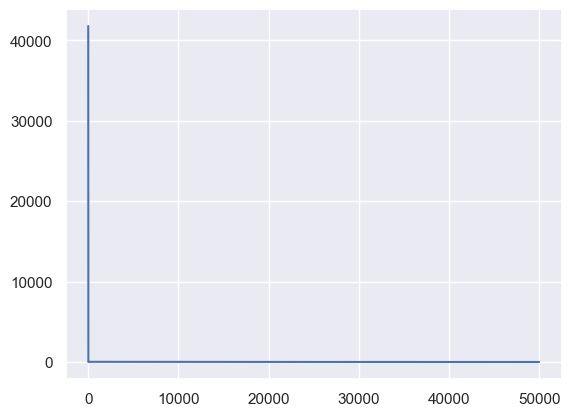

In [62]:
x = torch.tensor(list(range(0, epoch)), dtype=float)

fig, ax = plt.subplots()

_ = ax.plot(x, cost_gd)

100